# Image Captioning using CNN–RNN Architecture on MS COCO
**Advanced Machine Learning — Spring 2026 — Assignment 2**

**Team Members:**
- [Ahmed Ramy] — [13002184]
- [Saif Saad] — [14004494]
- [Ahmed Amr] — [13007323]
---

## Project Overview

This notebook implements an end-to-end deep learning pipeline for automatic image captioning.  
The architecture follows the classic **encoder-decoder** paradigm:

- **Encoder**: A pretrained **ResNet-50** CNN extracts a 2048-dimensional visual feature vector from each image.
- **Decoder**: An **LSTM**-based RNN generates captions word-by-word, conditioned on the visual features.
- **Auxiliary Classifier**: A multi-label classification head on the CNN features predicts COCO object categories, sharpening the visual representation.

We evaluate using **BLEU** scores on a held-out test set and qualitative inspection.

## Data Split Strategy

The Kaggle version of MS COCO does not include `val2014` or `test2014` images. We sample **60%** of the full training set and split it into three parts:

| Split | % of subset | ~Images | Purpose |
|---|---|---|---|
| **Train** | 85% | ~42,200 | Model training |
| **Val** | 10% | ~4,960 | Validation evaluation (separate BLEU report) |
| **Test** | 5% | ~2,480 | Final BLEU scores (used once, never tuned on) |

Training alone uses ~42,200 images, which is **51% of the full 82,783** — meeting the assignment's ≥50% requirement.

---
## 1. Imports & Configuration

In [1]:
# ============================================================
# 1.1 — Install any missing packages (run once)
# ============================================================
# Uncomment if needed:
#%pip install torch torchvision torchaudio
#%pip install nltk pycocotools matplotlib tqdm pillow scikit-learn
#%pip install scikit-learn

In [2]:
# ============================================================
# 1.2 — Imports
# ============================================================
import os
import json
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from collections import Counter
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence

import torchvision.transforms as transforms
import torchvision.models as models

from sklearn.model_selection import train_test_split

import nltk
from nltk.translate.bleu_score import corpus_bleu, sentence_bleu
nltk.download('punkt', quiet=True)
nltk.download('punkt_tab', quiet=True)

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: NVIDIA GeForce RTX 3050 Laptop GPU
VRAM: 4.3 GB


### Understanding the Subset & Split Fractions

This configuration uses a **2 level split** strategy — the fractions apply to different pools.

---

**Level 1 — Carve a working subset from the full dataset:**

> `Subset Pool = Full Dataset × 0.60 = 60% of full data`

---

**Level 2 — Split *within* that 60% subset pool:**

- **Validation:** 10% of subset
- **Test:** 5% of subset
- **Training:** 1 - 0.10 - 0.05 = **85% of subset** ← this is what the comment refers to

---

**Why training ends up at ~51% of the full dataset:**

The two levels are multiplied together:

> `Training share = SUBSET_FRACTION × (1 - VAL_FRACTION - TEST_FRACTION)`
> `= 0.60 × 0.85 = 0.51 → ~51% of the full dataset`

This is intentional — the project requires training on **at least 50%** of the full dataset, and `60% × 85% = 51%` just meets that threshold while still reserving held-out val and test sets.


In [ ]:
# ============================================================
# 1.3 — Configuration & Hyperparameters
# ============================================================
# All tuneable settings in one place for easy experimentation.

class Config:
    # ----- Paths (EDIT THESE to match your local setup) -----
    DATA_DIR = "./data"                          # Root folder for the dataset
    TRAIN_IMG_DIR = os.path.join(DATA_DIR, "train2014", "train2014")
    CAPTIONS_FILE = os.path.join(DATA_DIR, "captions", "annotations", "captions_train2014.json")
    INSTANCES_FILE = os.path.join(DATA_DIR, "captions", "annotations", "instances_train2014.json")
    
    FEATURES_DIR = "./features"                   # Where we save precomputed CNN features
    CHECKPOINT_DIR = "./checkpoints"               # Where we save model checkpoints
    
    # ----- Subset sampling and 3-way split -----
    SUBSET_FRACTION = 0.6          # Use 60% of the full dataset
    VAL_FRACTION = 0.10            # 10% of subset for validation
    TEST_FRACTION = 0.05           # 5% of subset for final test
    # Remaining 85% of subset goes to training
    # Result: ~51% of full dataset for training (meets >=50% requirement)
    RANDOM_SEED = 42
    
    # ----- Image preprocessing -----
    IMG_SIZE = 224                 # ResNet-50 expects 224x224
    CNN_FEATURE_DIM = 2048         # ResNet-50 output dimension
    
    # ----- Caption preprocessing -----
    MIN_WORD_FREQ = 5             # Words appearing fewer times become <unk>
    MAX_CAPTION_LEN = 25          # Max tokens per caption (including <start> and <end>)
    
    # ----- Model architecture -----
    EMBED_DIM = 256               # Word embedding dimension. Each word in the vocabulary is converted into a dense vector of 256 numbers to capture synonyms.
    HIDDEN_DIM = 512              # LSTM hidden state dimension. This is the model's "working memory" as it generates the caption word-by-word
    # 512 gives the LSTM more room to process and combine the image features + word embeddings.
    NUM_LSTM_LAYERS = 1           # Number of LSTM layers
    DROPOUT = 0.5                 # Dropout probability
    
    # ----- Auxiliary classifier -----
    NUM_COCO_CATEGORIES = 80      # COCO has 80 object categories
    AUX_LOSS_WEIGHT = 0.2         # Lambda for auxiliary classification loss
    
    # ----- Training -----
    BATCH_SIZE = 64               # Reduce to 32 if you encounter an error
    NUM_EPOCHS = 20
    LEARNING_RATE = 3e-4
    GRAD_CLIP = 5.0               # Gradient clipping max norm
    NUM_WORKERS = 0               # Must be 0 on Windows + Jupyter (avoids deadlock)
    
    # ----- Feature extraction -----
    FEATURE_BATCH_SIZE = 32       # Batch size for CNN feature precomputation
    USE_FP16 = True               # Mixed precision for feature extraction (saves VRAM)
    
    # ----- Inference -----
    BEAM_SIZE = 5                 # Beam width for beam search
    
    # ----- Device -----
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

cfg = Config()

# Reproducibility
random.seed(cfg.RANDOM_SEED)
np.random.seed(cfg.RANDOM_SEED)
torch.manual_seed(cfg.RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(cfg.RANDOM_SEED)

# Create output directories
os.makedirs(cfg.FEATURES_DIR, exist_ok=True)
os.makedirs(cfg.CHECKPOINT_DIR, exist_ok=True)

print(f"Device: {cfg.DEVICE}")
print(f"Subset fraction: {cfg.SUBSET_FRACTION*100:.0f}% of full dataset")
print(f"Splits: {(1-cfg.VAL_FRACTION-cfg.TEST_FRACTION)*100:.0f}% train / "
      f"{cfg.VAL_FRACTION*100:.0f}% val / {cfg.TEST_FRACTION*100:.0f}% test")

Device: cuda
Subset fraction: 60% of full dataset
Splits: 85% train / 10% val / 5% test


## Auxiliary Classifier:
This project adds a second training objective on top of caption generation, called an auxiliary (helper) loss.

It's a form of multi-task learning. By forcing the CNN features to also be good at recognizing objects, We:

Improve the visual encoder — it learns richer, more semantically meaningful image representations

Act as a regularizer — reduces overfitting on the captioning task alone

Ground the captions — the model is nudged to "notice" what objects are in the scene before describing them

## Feature Extraction Settings 
First, why is there a separate feature extraction phase at all:

Running ResNet-50 on every image at every training epoch is extremely slow and wasteful — the CNN weights are frozen (not trained), so it would produce identical outputs every time. Instead, the pipeline runs ResNet-50 once, saves the 2048-d output vectors to disk, and the LSTM training just loads those saved vectors. This is called precomputation.

---
## 2. Data Loading & Exploration

**Dataset setup:** Download the MS COCO dataset from [Kaggle](https://www.kaggle.com/datasets/hariwh0/ms-coco-dataset) and extract it.  
The directory structure should look like:

```
data/
├── train2014/
│   └── train2014/       # Training images
├── captions/
│   └── annotations/
│       ├── captions_train2014.json
│       ├── captions_val2014.json
│       ├── instances_train2014.json
│       └── instances_val2014.json
```

If your folder names differ, update the paths in the `Config` class above.

### 2.1 — Loading & Structuring COCO Annotations

The captions JSON is a flat file — it stores images and captions as 2 separate lists with no built in grouping. This cell loads it and restructures it into useful lookup dictionaries.

---

**Step 1 — Load the JSON**

Reads `captions_train2014.json` into a Python dictionary with 2 keys:
- `"images"` — list of `{id, file_name}` objects (~82,783 images)
- `"annotations"` — list of `{image_id, caption}` objects (~414,113 captions)

Each image has **~5 captions** written by different human annotators.

---

**Step 2 — Build `id_to_filename`**

A lookup from image ID → filename on disk:
```
{ 57870: "COCO_train2014_000000057870.jpg", ... }
```
Used later when loading images for CNN feature extraction.

---

**Step 3 — Build `id_to_captions`**

The annotations list is flat (one entry per caption), so this loop groups all captions by their image ID into a one-to-many mapping:
```
{ 57870: ["A dog running in a field",
           "A brown dog leaping through grass", ...] }
```

---

**Step 4 — Collect `all_image_ids`**

A flat list of every unique image ID. This becomes the master list that the subset sampling and train/val/test split will be applied to in the next section.

| Variable | Purpose |
|---|---|
| `id_to_filename` | image_id → filename on disk |
| `id_to_captions` | image_id → list of caption strings |
| `all_image_ids` | master list of unique image IDs |


In [4]:
# ============================================================
# 2.1 — Load COCO annotations
# ============================================================
# The captions JSON has this structure:
#   {"images": [{"id": ..., "file_name": ...}, ...],
#    "annotations": [{"image_id": ..., "caption": ...}, ...]}

with open(cfg.CAPTIONS_FILE, 'r') as f:
    train_coco = json.load(f)

print(f"Number of training images: {len(train_coco['images'])}")
print(f"Number of training captions: {len(train_coco['annotations'])}")
print(f"Captions per image: {len(train_coco['annotations']) / len(train_coco['images']):.1f}")

# Build a mapping: image_id -> file_name
id_to_filename = {img['id']: img['file_name'] for img in train_coco['images']}

# Build a mapping: image_id -> list of captions
id_to_captions = {}
for ann in train_coco['annotations']:
    img_id = ann['image_id']
    if img_id not in id_to_captions:
        id_to_captions[img_id] = []
    id_to_captions[img_id].append(ann['caption'])

all_image_ids = list(id_to_captions.keys())
print(f"\nUnique images with captions: {len(all_image_ids)}")
print(f"Sample captions per image: {[len(id_to_captions[i]) for i in all_image_ids[:5]]}")

Number of training images: 82783
Number of training captions: 414113
Captions per image: 5.0

Unique images with captions: 82783
Sample captions per image: [5, 5, 5, 5, 5]


### 2.2 — Subsampling & Train / Val / Test Split

This cell takes 60% of the full dataset and divides it into three disjoint splits using **two sequential `train_test_split` calls**.

---

**Step 1 — Sample the 60% subset**

`random.sample` picks images without replacement using the configured seed for reproducibility.

---

**Step 2 — First split: carve out the test set**

```
Subset (100%) → 95% train_val  +  5% test
```

The test set is held out entirely and never used until final evaluation.

---

**Step 3 — Second split: carve out the val set (with an adjustment)**

We want val to be **10% of the original subset**, but we are now splitting from the 95% remainder. Splitting 10% directly from 95% would only yield 9.5%, not 10%. The correction:

```
val_size_relative = VAL_FRACTION / (1 − TEST_FRACTION)
                  = 0.10 / 0.95
                  ≈ 10.53% of the 95% remainder → exactly 10% of the full subset
```

---

**Step 4 — Disjoint verification**

Set intersection (`&`) checks that zero images appear in more than one split. Any overlap would cause **data leakage**, where the model effectively sees test/val images during training, which inflates evaluation metrics.

---

**Final split picture**

```
Full dataset (~82,783 images)
    └── 60% subset (~49,669 images)
            ├── 85% → Train  (~42,219 images, ~211,000 captions)
            ├── 10% → Val    (~4,967  images,  ~24,800 captions)
            └──  5% → Test   (~2,483  images,  ~12,400 captions)

Training = 85% × 60% = 51% of full dataset (meets ≥ 50% requirement)
```

Caption counts are ~5× the image counts because each COCO image has five human-written captions, and each caption is one independent training example.


In [5]:
# ============================================================
# 2.2 — Subsample (60%) and split into train/val/test
# ============================================================
# Step 1: Randomly sample 60% of all images.
# Step 2: Split into 85% train / 10% val / 5% test.
# All splits are disjoint — val and test images are NEVER seen during training.

num_subset = int(len(all_image_ids) * cfg.SUBSET_FRACTION)
subset_image_ids = sorted(random.sample(all_image_ids, num_subset))

# First split: separate test set (5% of subset)
train_val_ids, test_image_ids = train_test_split(
    subset_image_ids, test_size=cfg.TEST_FRACTION, random_state=cfg.RANDOM_SEED
)

# Second split: separate val from remaining train_val
# We need val to be VAL_FRACTION of the original subset, not of train_val
val_size_relative = cfg.VAL_FRACTION / (1 - cfg.TEST_FRACTION)
train_image_ids, val_image_ids = train_test_split(
    train_val_ids, test_size=val_size_relative, random_state=cfg.RANDOM_SEED
)

train_image_ids = sorted(train_image_ids)
val_image_ids = sorted(val_image_ids)
test_image_ids = sorted(test_image_ids)

# Verify no overlap between any pair of splits
train_set, val_set, test_set = set(train_image_ids), set(val_image_ids), set(test_image_ids)
assert len(train_set & val_set) == 0, "Train/val overlap!"
assert len(train_set & test_set) == 0, "Train/test overlap!"
assert len(val_set & test_set) == 0, "Val/test overlap!"

# Caption counts
train_caps = sum(len(id_to_captions[i]) for i in train_image_ids)
val_caps = sum(len(id_to_captions[i]) for i in val_image_ids)
test_caps = sum(len(id_to_captions[i]) for i in test_image_ids)

print(f"Full dataset:    {len(all_image_ids):>6} images")
print(f"Subset (60%):    {len(subset_image_ids):>6} images")
print("-" * 50)
print(f"Train  ({len(train_image_ids)/len(subset_image_ids)*100:>4.1f}%): {len(train_image_ids):>6} images, {train_caps:>7} captions")
print(f"Val    ({len(val_image_ids)/len(subset_image_ids)*100:>4.1f}%): {len(val_image_ids):>6} images, {val_caps:>7} captions")
print(f"Test   ({len(test_image_ids)/len(subset_image_ids)*100:>4.1f}%): {len(test_image_ids):>6} images, {test_caps:>7} captions")
print("-" * 50)
print(f"Training uses {len(train_image_ids)/len(all_image_ids)*100:.1f}% of full dataset (>=50% required)")
print(f"All splits verified disjoint.")

Full dataset:     82783 images
Subset (60%):     49669 images
--------------------------------------------------
Train  (85.0%):  42218 images,  211188 captions
Val    (10.0%):   4967 images,   24843 captions
Test   ( 5.0%):   2484 images,   12430 captions
--------------------------------------------------
Training uses 51.0% of full dataset (>=50% required)
All splits verified disjoint.


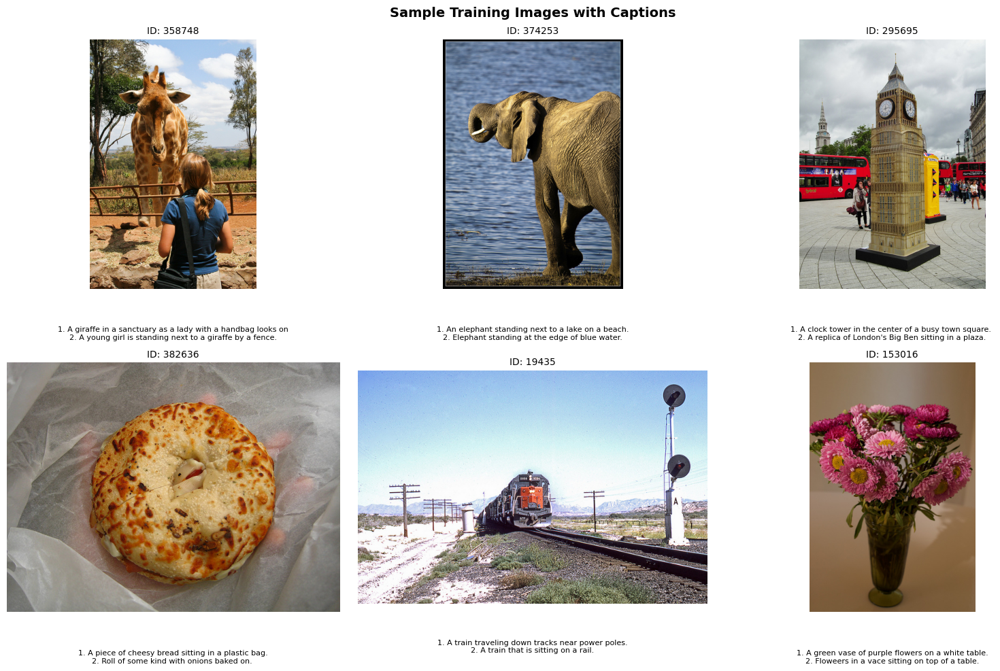

In [6]:
# ============================================================
# 2.3 — Visualize sample images with captions
# ============================================================
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
sample_ids = random.sample(train_image_ids, 6)

for ax, img_id in zip(axes.flat, sample_ids):
    img_path = os.path.join(cfg.TRAIN_IMG_DIR, id_to_filename[img_id])
    img = Image.open(img_path).convert('RGB')
    ax.imshow(img)
    ax.set_title(f"ID: {img_id}", fontsize=10)
    ax.axis('off')
    # Show first 2 captions below the image
    captions = id_to_captions[img_id][:2]
    caption_text = '\n'.join([f"{i+1}. {c}" for i, c in enumerate(captions)])
    ax.text(0.5, -0.15, caption_text, transform=ax.transAxes,
            fontsize=8, ha='center', va='top', wrap=True)

plt.suptitle("Sample Training Images with Captions", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

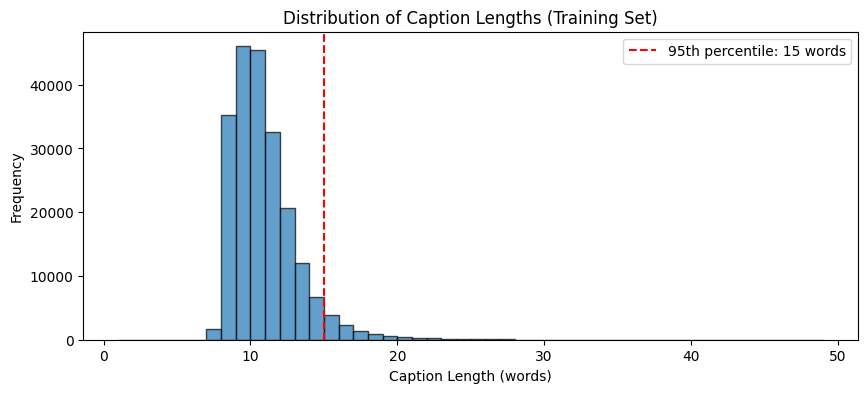

Mean caption length: 10.5 words
Median caption length: 10.0 words
95th percentile: 15 words
Max caption length: 49 words


In [7]:
# ============================================================
# 2.4 — Caption length distribution (training set)
# ============================================================
all_lengths = []
for img_id in train_image_ids:
    for cap in id_to_captions[img_id]:
        all_lengths.append(len(cap.split()))

plt.figure(figsize=(10, 4))
plt.hist(all_lengths, bins=range(1, 50), edgecolor='black', alpha=0.7)
plt.xlabel('Caption Length (words)')
plt.ylabel('Frequency')
plt.title('Distribution of Caption Lengths (Training Set)')
plt.axvline(x=np.percentile(all_lengths, 95), color='r', linestyle='--',
            label=f'95th percentile: {np.percentile(all_lengths, 95):.0f} words')
plt.legend()
plt.show()

print(f"Mean caption length: {np.mean(all_lengths):.1f} words")
print(f"Median caption length: {np.median(all_lengths):.1f} words")
print(f"95th percentile: {np.percentile(all_lengths, 95):.0f} words")
print(f"Max caption length: {max(all_lengths)} words")

---
## 3. Caption Preprocessing

Steps:
1. **Clean** captions: lowercase, strip punctuation
2. **Build vocabulary** from training captions only (words with frequency >= MIN_WORD_FREQ)
3. **Numericalize**: convert each caption to a sequence of integer indices
4. **Pad** all sequences to a fixed length

In [8]:
# ============================================================
# 3.1 — Caption cleaning
# ============================================================
import re

def clean_caption(caption):
    """Lowercase, remove punctuation (keep apostrophes), collapse whitespace."""
    caption = caption.lower().strip()
    # Remove all punctuation except apostrophes
    caption = re.sub(r"[^a-z0-9\s']", '', caption)
    # Collapse multiple spaces
    caption = re.sub(r'\s+', ' ', caption).strip()
    return caption

# Apply cleaning to ALL captions in our subset (train + val + test)
# We need cleaned val/test captions later for BLEU reference comparisons
cleaned_captions = {}  # image_id -> [cleaned_caption_1, ...]
for img_id in subset_image_ids:
    cleaned_captions[img_id] = [clean_caption(c) for c in id_to_captions[img_id]]

# Show examples of before/after cleaning
sample_id = train_image_ids[0]
print("Before cleaning:")
for c in id_to_captions[sample_id][:3]:
    print(f"  {c}")
print("\nAfter cleaning:")
for c in cleaned_captions[sample_id][:3]:
    print(f"  {c}")

Before cleaning:
  Closeup of bins of food that include broccoli and bread.
  A meal is presented in brightly colored plastic trays.
  there are containers filled with different kinds of foods

After cleaning:
  closeup of bins of food that include broccoli and bread
  a meal is presented in brightly colored plastic trays
  there are containers filled with different kinds of foods


### 3.2 — Building the Vocabulary

The model cannot process raw text — it only works with numbers. The `Vocabulary` class is a **2 way lookup table** that maps every word to a unique integer index and back.

---

**Special Tokens (added first, indices are always fixed)**

| Token | Index | Purpose |
|---------|-------|---------|
| `<pad>` | 0 | Pads shorter captions to equal length in a batch |
| `<start>` | 1 | Signals the LSTM to begin generating |
| `<end>` | 2 | Signals the LSTM to stop generating |
| `<unk>` | 3 | Replaces any word not in the vocabulary |

---

**`build_from_captions` — Two-pass process**

- **Pass 1:** Count how many times every word appears across all training captions
- **Pass 2:** Only add words that appear **≥ 5 times** (`MIN_WORD_FREQ`) — rarer words are too noisy to learn from and become `<unk>` at encode time

> Built from **training captions only**. Including val/test captions would be vocabulary leakage — the model would "know" words from data it is supposed to have never seen.

---

**`encode` — caption string → integer list**

```
"a dog runs fast" → [1,  45, 203, 891, 204,  2]
                     ↑                        ↑
                  <start>                  <end>
```
Unknown words are silently replaced with index 3 (`<unk>`).

---

**`decode` — integer list → caption string**

Reverses the above. Stops at `<end>`, skips `<start>` and `<pad>`. Used when displaying generated captions at inference time.

---

**Data flow summary**

```
Raw caption string
      ↓  encode()
[1, 45, 203, 891, 2]   ← fed into the LSTM during training
      ↓  decode()
Readable caption string ← displayed at inference
```


In [9]:
# ============================================================
# 3.2 — Build vocabulary (from TRAINING captions only)
# ============================================================
# Vocabulary must NOT include val/test words — those would leak
# information about the held-out sets into the model.

class Vocabulary:
    """Maps words to integer indices and back."""
    
    def __init__(self):
        self.word2idx = {}
        self.idx2word = {}
        self.word_freq = Counter()
        self.idx = 0
        
        # Add special tokens (order matters: <pad>=0, <start>=1, <end>=2, <unk>=3)
        self.pad_idx = self.add_word('<pad>')
        self.start_idx = self.add_word('<start>')
        self.end_idx = self.add_word('<end>')
        self.unk_idx = self.add_word('<unk>')
    
    def add_word(self, word):
        """Add a word to the vocabulary and return its index."""
        if word not in self.word2idx:
            self.word2idx[word] = self.idx
            self.idx2word[self.idx] = word
            self.idx += 1
        return self.word2idx[word]
    
    def build_from_captions(self, captions_dict, image_ids, min_freq):
        """Build vocabulary from captions of specified image_ids only."""
        # Count word frequencies from training images only
        for img_id in image_ids:
            for caption in captions_dict[img_id]:
                tokens = caption.split()
                self.word_freq.update(tokens)
        
        # Add words that meet the minimum frequency threshold
        for word, freq in self.word_freq.items():
            if freq >= min_freq:
                self.add_word(word)
    
    def encode(self, caption):
        """Convert a caption string to a list of token indices."""
        tokens = caption.split()
        encoded = [self.start_idx]
        encoded += [self.word2idx.get(t, self.unk_idx) for t in tokens]
        encoded += [self.end_idx]
        return encoded
    
    def decode(self, indices):
        """Convert a list of token indices back to a caption string."""
        words = []
        for idx in indices:
            word = self.idx2word.get(idx, '<unk>')
            if word == '<end>':
                break
            if word not in ('<start>', '<pad>'):
                words.append(word)
        return ' '.join(words)
    
    def __len__(self):
        return len(self.word2idx)


# Build the vocabulary from TRAINING captions only
vocab = Vocabulary()
vocab.build_from_captions(cleaned_captions, train_image_ids, min_freq=cfg.MIN_WORD_FREQ)

total_unique_words = len(vocab.word_freq)
print(f"Total unique words in training captions: {total_unique_words}")
print(f"Vocabulary size (freq >= {cfg.MIN_WORD_FREQ}): {len(vocab)}")
print(f"Words removed (below threshold): {total_unique_words - len(vocab) + 4}")
print(f"\nSpecial tokens: <pad>={vocab.pad_idx}, <start>={vocab.start_idx}, "
      f"<end>={vocab.end_idx}, <unk>={vocab.unk_idx}")

# Quick sanity check: encode and decode a caption
sample_caption = cleaned_captions[train_image_ids[0]][0]
encoded = vocab.encode(sample_caption)
decoded = vocab.decode(encoded)
print(f"\nOriginal:  '{sample_caption}'")
print(f"Encoded:   {encoded}")
print(f"Decoded:   '{decoded}'")

Total unique words in training captions: 18685
Vocabulary size (freq >= 5): 6637
Words removed (below threshold): 12052

Special tokens: <pad>=0, <start>=1, <end>=2, <unk>=3

Original:  'closeup of bins of food that include broccoli and bread'
Encoded:   [1, 4, 5, 6, 5, 7, 8, 9, 10, 11, 12, 2]
Decoded:   'closeup of bins of food that include broccoli and bread'


In [10]:
# ============================================================
# 3.3 — Numericalize and pad training captions
# ============================================================

def encode_and_pad(caption, vocab, max_len):
    """Encode a caption and pad/truncate to max_len."""
    encoded = vocab.encode(caption)
    length = min(len(encoded), max_len)  # actual length before padding
    
    if len(encoded) > max_len:
        encoded = encoded[:max_len - 1] + [vocab.end_idx]  # ensure <end> is present
        length = max_len
    else:
        # Pad with <pad> tokens
        encoded = encoded + [vocab.pad_idx] * (max_len - len(encoded))
    
    return encoded, length

# Prepare the training data: ONLY from train_image_ids
train_data = []
for img_id in train_image_ids:
    for caption in cleaned_captions[img_id]:
        encoded, length = encode_and_pad(caption, vocab, cfg.MAX_CAPTION_LEN)
        train_data.append((img_id, encoded, length))

print(f"Total training samples (image-caption pairs): {len(train_data)}")
print(f"Max caption length (with special tokens): {cfg.MAX_CAPTION_LEN}")
print(f"\nVal images ({len(val_image_ids)}) and test images ({len(test_image_ids)}) excluded from training.")

# Show a sample
sample = train_data[0]
print(f"\nSample entry:")
print(f"  Image ID: {sample[0]}")
print(f"  Encoded:  {sample[1][:15]}... (length={sample[2]})")

Total training samples (image-caption pairs): 211188
Max caption length (with special tokens): 25

Val images (4967) and test images (2484) excluded from training.

Sample entry:
  Image ID: 9
  Encoded:  [1, 4, 5, 6, 5, 7, 8, 9, 10, 11, 12, 2, 0, 0, 0]... (length=12)


---
## 4. Image Feature Extraction (CNN Encoder)

We use a **pretrained ResNet-50** with its final classification layer removed.  
This produces a **2048-dimensional** feature vector per image.  

We precompute and save these features to disk so the decoder training doesn't
need to re-run the CNN every epoch — this is the key to feasibility on 4–6 GB VRAM.

We extract features for **all** subset images (train + val + test) in one pass.  
The val/test features are used only during evaluation, never during training to avoid data leakage.

### 4.1 — CNN Feature Extractor Setup

Instead of training a vision model from scratch, we use a **pretrained ResNet-50** as a frozen feature extractor. It converts raw images into compact 2048-dimensional vectors that summarize the visual content.

---

**Why remove the final FC layer?**

ResNet-50's original architecture ends with:
```
Conv layers → AvgPool → FC (1000 outputs)  ← classifies ImageNet categories
```
The FC layer is task-specific (ImageNet classification) and discarded. Everything up to and including `AvgPool` is kept — this outputs a rich **2048-d visual feature vector** that captures *what is in the image* without committing to any specific label.

```python
self.backbone = nn.Sequential(*list(resnet.children())[:-1])
# [:-1] removes the last child (the FC layer)
# output shape: (B, 2048, 1, 1)
```

The `.squeeze()` calls remove the trailing spatial dimensions → final shape: `(B, 2048)`.

---

**`torch.no_grad()` in the forward pass**

ResNet weights are frozen — we never update them. Wrapping in `no_grad()` skips gradient computation entirely, saving memory and speeding up the feature extraction pass.

---

**Image transforms pipeline**

Every image goes through four steps before entering ResNet:

| Step | Value | Reason |
|------|-------|--------|
| `Resize(256)` | shorter edge → 256px | standardize input size |
| `CenterCrop(224)` | crop to 224×224 | ResNet-50 expects exactly 224×224 |
| `ToTensor()` | pixel values → [0, 1] float | converts from PIL uint8 |
| `Normalize(mean, std)` | ImageNet statistics | matches the distribution ResNet was pretrained on |

The `mean` and `std` values (`[0.485, 0.456, 0.406]` and `[0.229, 0.224, 0.225]`) are the **channel-wise statistics of the ImageNet dataset** — using them is required to get meaningful features from the pretrained weights.

---

**Summary**

```
224×224 RGB image
      ↓  image_transform
Normalized tensor (3, 224, 224)
      ↓  ResNetFeatureExtractor
2048-dimensional feature vector  ← saved to disk, used by LSTM during training
```


In [11]:
# ============================================================
# 4.1 — Set up the feature extractor
# ============================================================

class ResNetFeatureExtractor(nn.Module):
    """ResNet-50 with the final FC layer removed. Outputs a 2048-d vector."""
    
    def __init__(self):
        super().__init__()
        resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
        # Remove the final fully-connected layer
        # ResNet-50 architecture: conv layers -> avgpool -> fc
        # We keep everything up to (and including) avgpool
        self.backbone = nn.Sequential(*list(resnet.children())[:-1])  # output: (B, 2048, 1, 1)
    
    def forward(self, x):
        with torch.no_grad():
            features = self.backbone(x)       # (B, 2048, 1, 1)
            features = features.squeeze(-1).squeeze(-1)  # (B, 2048)
        return features

# Image transforms: resize, center-crop, normalize with ImageNet stats
image_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(cfg.IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

print("Feature extractor ready.")
print(f"Input: {cfg.IMG_SIZE}x{cfg.IMG_SIZE} RGB image")
print(f"Output: {cfg.CNN_FEATURE_DIM}-dimensional feature vector")

Feature extractor ready.
Input: 224x224 RGB image
Output: 2048-dimensional feature vector


In [ ]:
# ============================================================
# 4.2 — Precompute and save CNN features for ALL subset images
# ============================================================
# We extract features for train + val + test in one pass.
# This is efficient (only one ResNet forward pass over the dataset)
# and the val/test features are ONLY used during evaluation, never training.
#
# Run it once, then features are saved to disk for all future runs.

features_path = os.path.join(cfg.FEATURES_DIR, "train_features.npy")
feature_ids_path = os.path.join(cfg.FEATURES_DIR, "train_image_ids.npy")

if os.path.exists(features_path) and os.path.exists(feature_ids_path):
    # Load precomputed features
    print("Loading precomputed features from disk...")
    all_features = np.load(features_path)
    feature_image_ids = np.load(feature_ids_path)
    print(f"Loaded features: {all_features.shape}")
    
    # Check if loaded features cover our current subset
    loaded_ids_set = set(int(x) for x in feature_image_ids)
    current_subset_set = set(subset_image_ids)
    missing = current_subset_set - loaded_ids_set
    if missing:
        print(f"\nWARNING: {len(missing)} images in current subset are missing from features file!")
        print("Delete features/*.npy and re-run this cell to regenerate features.")
else:
    print("Precomputing CNN features")
    
    # Move feature extractor to GPU
    cnn = ResNetFeatureExtractor().to(cfg.DEVICE)
    cnn.eval()
    
    all_features = []
    feature_image_ids = []
    
    # Process ALL subset images (train + val + test) in batches
    batch_images = []
    batch_ids = []
    
    for i, img_id in enumerate(tqdm(subset_image_ids, desc="Extracting features")):
        img_path = os.path.join(cfg.TRAIN_IMG_DIR, id_to_filename[img_id])
        try:
            img = Image.open(img_path).convert('RGB')
            img_tensor = image_transform(img)
            batch_images.append(img_tensor)
            batch_ids.append(img_id)
        except Exception as e:
            print(f"  Warning: could not load {img_path}: {e}")
            continue
        
        # When batch is full (or last image), extract features
        if len(batch_images) == cfg.FEATURE_BATCH_SIZE or i == len(subset_image_ids) - 1:
            batch_tensor = torch.stack(batch_images).to(cfg.DEVICE)
            
            # Use mixed precision to save VRAM
            if cfg.USE_FP16 and cfg.DEVICE.type == 'cuda':
                with torch.cuda.amp.autocast():
                    features = cnn(batch_tensor)
            else:
                features = cnn(batch_tensor)
            
            all_features.append(features.cpu().numpy().astype(np.float32))
            feature_image_ids.extend(batch_ids)
            
            # Clear batch
            batch_images = []
            batch_ids = []
            
            # Free GPU memory periodically
            if cfg.DEVICE.type == 'cuda':
                torch.cuda.empty_cache()
    
    # Concatenate all batches
    all_features = np.concatenate(all_features, axis=0)
    feature_image_ids = np.array(feature_image_ids)
    
    # Save to disk
    np.save(features_path, all_features)
    np.save(feature_ids_path, feature_image_ids)
    
    # Free the CNN from GPU memory — we don't need it anymore
    del cnn
    if cfg.DEVICE.type == 'cuda':
        torch.cuda.empty_cache()
    
    print(f"\nSaved features: {all_features.shape} -> {features_path}")
    print(f"File size: {os.path.getsize(features_path) / 1e6:.1f} MB")

# Build a quick lookup: image_id -> index into the features array
id_to_feature_idx = {int(img_id): idx for idx, img_id in enumerate(feature_image_ids)}
print(f"\nFeatures ready for {len(id_to_feature_idx)} images (train + val + test).")

Precomputing CNN features (this runs once, ~20-40 min on GPU)...


Extracting features:   0%|          | 30/49669 [00:00<14:43, 56.18it/s]C:\Users\Ahmed's laptop\AppData\Local\Temp\ipykernel_30368\1302007794.py:59: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Extracting features: 100%|██████████| 49669/49669 [16:08<00:00, 51.31it/s]



Saved features: (49669, 2048) -> ./features\train_features.npy
File size: 406.9 MB

Features ready for 49669 images (train + val + test).


---
## 5. Auxiliary Classification (Object Category Prediction)

COCO provides 80 object category labels per image (via bounding box annotations).  
We train a small **multi-label classifier** on the precomputed CNN features to predict  
which object categories are present. This auxiliary task sharpens the feature vectors  
and improves caption relevance.

We first train the classifier standalone to validate the features, then integrate it
into the full captioning model for joint training.

In [13]:
# ============================================================
# 5.1 — Load COCO object category annotations
# ============================================================
with open(cfg.INSTANCES_FILE, 'r') as f:
    instances_coco = json.load(f)

# Get the 80 COCO category IDs and build a mapping to 0-79 indices
coco_categories = {cat['id']: cat['name'] for cat in instances_coco['categories']}
cat_id_to_idx = {cat_id: idx for idx, cat_id in enumerate(sorted(coco_categories.keys()))}
idx_to_cat_name = {idx: coco_categories[cat_id] for cat_id, idx in cat_id_to_idx.items()}

print(f"COCO object categories: {len(coco_categories)}")
print(f"Sample categories: {list(coco_categories.values())[:10]}")

# Build multi-hot labels for each image: image_id -> 80-d binary vector
id_to_category_labels = {}
for ann in instances_coco['annotations']:
    img_id = ann['image_id']
    cat_idx = cat_id_to_idx[ann['category_id']]
    if img_id not in id_to_category_labels:
        id_to_category_labels[img_id] = np.zeros(cfg.NUM_COCO_CATEGORIES, dtype=np.float32)
    id_to_category_labels[img_id][cat_idx] = 1.0

# Count how many of our TRAINING images have category labels
labeled_count = sum(1 for img_id in train_image_ids if img_id in id_to_category_labels)
print(f"\nTraining images with category labels: {labeled_count}/{len(train_image_ids)}")

COCO object categories: 80
Sample categories: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light']

Training images with category labels: 41869/42218


In [14]:
# ============================================================
# 5.2 — Auxiliary classifier model
# ============================================================

class AuxiliaryClassifier(nn.Module):
    """Multi-label classifier: 2048-d features -> 80 object categories."""
    
    def __init__(self, feature_dim, num_classes, dropout=0.3):
        super().__init__()
        self.classifier = nn.Sequential(
            nn.Linear(feature_dim, 512),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(512, num_classes)
        )
    
    def forward(self, features):
        return self.classifier(features)  # raw logits (use BCEWithLogitsLoss)

print("Auxiliary classifier defined.")

Auxiliary classifier defined.


In [ ]:
# ============================================================
# 5.3 — Train the auxiliary classifier (standalone validation)
# ============================================================
# This is a quick standalone training to verify that the ResNet
# features contain useful object-level information. The classifier
# will be re-initialized and trained jointly in the full pipeline.
#
# Uses TRAINING images only — val/test images are held out.

cls_features = []
cls_labels = []
for img_id in train_image_ids:
    if img_id in id_to_category_labels and img_id in id_to_feature_idx:
        feat_idx = id_to_feature_idx[img_id]
        cls_features.append(all_features[feat_idx])
        cls_labels.append(id_to_category_labels[img_id])

cls_features = np.array(cls_features)
cls_labels = np.array(cls_labels)
print(f"Classifier training data: {cls_features.shape[0]} images (train split only)")

# Simple dataset for the classifier
class ClassifierDataset(Dataset):
    def __init__(self, features, labels):
        self.features = torch.tensor(features, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.float32)
    
    def __len__(self):
        return len(self.features)
    
    def __getitem__(self, idx):
        return self.features[idx], self.labels[idx]

cls_dataset = ClassifierDataset(cls_features, cls_labels)
cls_loader = DataLoader(cls_dataset, batch_size=256, shuffle=True)

# Train
aux_classifier = AuxiliaryClassifier(cfg.CNN_FEATURE_DIM, cfg.NUM_COCO_CATEGORIES).to(cfg.DEVICE)
aux_optimizer = optim.Adam(aux_classifier.parameters(), lr=1e-3)
aux_criterion = nn.BCEWithLogitsLoss()

print("\nTraining auxiliary classifier (standalone validation)...")
aux_classifier.train()
for epoch in range(5):
    total_loss = 0
    for feats, labels in cls_loader:
        feats, labels = feats.to(cfg.DEVICE), labels.to(cfg.DEVICE)
        logits = aux_classifier(feats)
        loss = aux_criterion(logits, labels)
        
        aux_optimizer.zero_grad()
        loss.backward()
        aux_optimizer.step()
        total_loss += loss.item()
    
    avg_loss = total_loss / len(cls_loader)
    print(f"  Epoch {epoch+1}/5 — Loss: {avg_loss:.4f}")

# Quick evaluation: check predictions on a sample image
aux_classifier.eval()
with torch.no_grad():
    sample_feat = torch.tensor(cls_features[0:1]).to(cfg.DEVICE)
    preds = torch.sigmoid(aux_classifier(sample_feat)).cpu().numpy()[0]
    top_indices = np.argsort(preds)[::-1][:5]
    print(f"\nSample prediction (top 5 categories):")
    for idx in top_indices:
        print(f"  {idx_to_cat_name[idx]}: {preds[idx]:.3f}")

print("\nAuxiliary classifier validated. (Will be re-initialized for joint training.)")

Classifier training data: 41869 images (train split only)

Training auxiliary classifier (standalone validation)...
  Epoch 1/5 — Loss: 0.1188
  Epoch 2/5 — Loss: 0.0630
  Epoch 3/5 — Loss: 0.0575
  Epoch 4/5 — Loss: 0.0544
  Epoch 5/5 — Loss: 0.0522

Sample prediction (top 5 categories):
  broccoli: 0.841
  carrot: 0.539
  bowl: 0.511
  dining table: 0.199
  sandwich: 0.139

Auxiliary classifier validated. (Will be re-initialized for joint training.)


---
## 6. Dataset & DataLoader for Caption Training

In [16]:
# ============================================================
# 6.1 — Caption dataset using precomputed features
# ============================================================

class CaptionDataset(Dataset):
    """
    Each sample is (feature_vector, encoded_caption, caption_length, category_label).
    Features are precomputed and loaded from a numpy array.
    """
    
    def __init__(self, train_data, all_features, id_to_feature_idx,
                 id_to_category_labels, num_categories):
        # Filter out entries whose image_id is missing from the features
        self.data = [
            (img_id, caption, length)
            for img_id, caption, length in train_data
            if img_id in id_to_feature_idx
        ]
        self.all_features = all_features
        self.id_to_feature_idx = id_to_feature_idx
        self.id_to_category_labels = id_to_category_labels
        self.num_categories = num_categories
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        img_id, caption, length = self.data[idx]
        
        # Get precomputed CNN feature vector
        feat_idx = self.id_to_feature_idx[img_id]
        feature = torch.tensor(self.all_features[feat_idx], dtype=torch.float32)
        
        # Caption as tensor
        caption_tensor = torch.tensor(caption, dtype=torch.long)
        
        # Category label (for auxiliary loss)
        if img_id in self.id_to_category_labels:
            cat_label = torch.tensor(self.id_to_category_labels[img_id], dtype=torch.float32)
        else:
            cat_label = torch.zeros(self.num_categories, dtype=torch.float32)
        
        return feature, caption_tensor, torch.tensor(length, dtype=torch.long), cat_label


# Create dataset and dataloader
caption_dataset = CaptionDataset(
    train_data, all_features, id_to_feature_idx,
    id_to_category_labels, cfg.NUM_COCO_CATEGORIES
)

caption_loader = DataLoader(
    caption_dataset,
    batch_size=cfg.BATCH_SIZE,
    shuffle=True,
    num_workers=cfg.NUM_WORKERS,
    pin_memory=True
)

print(f"Caption dataset size: {len(caption_dataset)} samples")
print(f"Batches per epoch: {len(caption_loader)}")

# Verify a batch
sample_batch = next(iter(caption_loader))
feats, caps, lens, cats = sample_batch
print(f"\nBatch shapes:")
print(f"  Features:  {feats.shape}")   # (B, 2048)
print(f"  Captions:  {caps.shape}")    # (B, max_len)
print(f"  Lengths:   {lens.shape}")    # (B,)
print(f"  Cat labels: {cats.shape}")   # (B, 80)

Caption dataset size: 211188 samples
Batches per epoch: 3300

Batch shapes:
  Features:  torch.Size([64, 2048])
  Captions:  torch.Size([64, 25])
  Lengths:   torch.Size([64])
  Cat labels: torch.Size([64, 80])


---
## 7. Model Architecture

The decoder consists of:
1. **Feature projector**: Linear layer mapping 2048-d CNN features to `embed_dim`
2. **Word embedding**: `nn.Embedding` mapping word indices to `embed_dim`
3. **LSTM decoder**: Generates hidden states conditioned on the image + previous words
4. **Output layer**: Linear mapping `hidden_dim → vocab_size` to predict the next word

The image feature is injected as the **first input** at timestep 0.  
During training, we use **teacher forcing** (feed ground-truth words, not predictions).

In [17]:
# ============================================================
# 7.1 — Encoder (feature projector)
# ============================================================

class Encoder(nn.Module):
    """Projects the 2048-d CNN feature down to embed_dim."""
    
    def __init__(self, feature_dim, embed_dim):
        super().__init__()
        self.fc = nn.Linear(feature_dim, embed_dim)
        self.bn = nn.BatchNorm1d(embed_dim)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)
    
    def forward(self, features):
        """features: (B, 2048) -> (B, embed_dim)"""
        x = self.fc(features)      # (B, embed_dim)
        x = self.bn(x)
        x = self.relu(x)
        x = self.dropout(x)
        return x

print("Encoder defined.")

Encoder defined.


In [18]:
# ============================================================
# 7.2 — Decoder (LSTM with word embeddings)
# ============================================================

class Decoder(nn.Module):
    """
    LSTM decoder that generates captions word-by-word.
    
    At timestep 0, the input is the projected image feature.
    At timesteps 1..T, the input is the embedding of the previous word.
    """
    
    def __init__(self, vocab_size, embed_dim, hidden_dim, num_layers=1, dropout=0.5):
        super().__init__()
        
        self.embed = nn.Embedding(vocab_size, embed_dim, padding_idx=0)
        self.lstm = nn.LSTM(
            input_size=embed_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0
        )
        self.fc_out = nn.Linear(hidden_dim, vocab_size)
        self.dropout = nn.Dropout(dropout)
        
        self.vocab_size = vocab_size
        self.hidden_dim = hidden_dim
    
    def forward(self, image_features, captions, lengths):
        """
        Forward pass with teacher forcing.
        
        Args:
            image_features: (B, embed_dim) — projected image features from Encoder
            captions: (B, max_len) — ground-truth caption indices
            lengths: (B,) — actual caption lengths (before padding)
        
        Returns:
            outputs: (B, max_len, vocab_size) — predicted word logits at each timestep
        """
        # Embed the caption words: (B, max_len, embed_dim)
        embeddings = self.dropout(self.embed(captions))
        
        # Prepend the image feature as the first "word": (B, 1, embed_dim)
        image_features = image_features.unsqueeze(1)
        
        # Concatenate: [image_feature, word_1, word_2, ..., word_T-1]
        # We drop the last word in the caption (we don't need to predict after <end>)
        lstm_input = torch.cat([image_features, embeddings[:, :-1, :]], dim=1)  # (B, max_len, embed_dim)
        
        # Pack padded sequences for efficient LSTM processing
        packed = pack_padded_sequence(lstm_input, lengths.cpu(), batch_first=True, enforce_sorted=False)
        
        # Run LSTM
        lstm_out, _ = self.lstm(packed)
        
        # Unpack
        lstm_out, _ = pad_packed_sequence(lstm_out, batch_first=True)  # (B, max_seq, hidden_dim)
        
        # Project to vocabulary
        outputs = self.fc_out(lstm_out)  # (B, max_seq, vocab_size)
        
        return outputs

print("Decoder defined.")

Decoder defined.


In [19]:
# ============================================================
# 7.3 — Combined Captioning Model
# ============================================================

class ImageCaptioningModel(nn.Module):
    """
    Full model: Encoder (feature projector) + Decoder (LSTM) + Auxiliary Classifier.
    """
    
    def __init__(self, feature_dim, embed_dim, hidden_dim, vocab_size,
                 num_categories, num_layers=1, dropout=0.5):
        super().__init__()
        self.encoder = Encoder(feature_dim, embed_dim)
        self.decoder = Decoder(vocab_size, embed_dim, hidden_dim, num_layers, dropout)
        self.aux_classifier = AuxiliaryClassifier(feature_dim, num_categories, dropout)
    
    def forward(self, features, captions, lengths):
        """
        Args:
            features: (B, 2048) raw CNN features
            captions: (B, max_len) encoded captions
            lengths: (B,) caption lengths
        
        Returns:
            caption_outputs: (B, max_seq, vocab_size)
            category_logits: (B, num_categories)
        """
        # Project features for the decoder
        projected = self.encoder(features)         # (B, embed_dim)
        
        # Generate caption logits
        caption_outputs = self.decoder(projected, captions, lengths)
        
        # Auxiliary classification on the raw features
        category_logits = self.aux_classifier(features)
        
        return caption_outputs, category_logits


# Instantiate the model
model = ImageCaptioningModel(
    feature_dim=cfg.CNN_FEATURE_DIM,
    embed_dim=cfg.EMBED_DIM,
    hidden_dim=cfg.HIDDEN_DIM,
    vocab_size=len(vocab),
    num_categories=cfg.NUM_COCO_CATEGORIES,
    num_layers=cfg.NUM_LSTM_LAYERS,
    dropout=cfg.DROPOUT
).to(cfg.DEVICE)

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"\nModel architecture:")
print(model)

Total parameters: 8,295,997
Trainable parameters: 8,295,997

Model architecture:
ImageCaptioningModel(
  (encoder): Encoder(
    (fc): Linear(in_features=2048, out_features=256, bias=True)
    (bn): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
    (dropout): Dropout(p=0.5, inplace=False)
  )
  (decoder): Decoder(
    (embed): Embedding(6637, 256, padding_idx=0)
    (lstm): LSTM(256, 512, batch_first=True)
    (fc_out): Linear(in_features=512, out_features=6637, bias=True)
    (dropout): Dropout(p=0.5, inplace=False)
  )
  (aux_classifier): AuxiliaryClassifier(
    (classifier): Sequential(
      (0): Linear(in_features=2048, out_features=512, bias=True)
      (1): ReLU()
      (2): Dropout(p=0.5, inplace=False)
      (3): Linear(in_features=512, out_features=80, bias=True)
    )
  )
)


---
## 8. Training Loop

In [20]:
# ============================================================
# 8.1 — Loss functions and optimizer
# ============================================================

# Caption loss: CrossEntropy, ignoring <pad> tokens (index 0)
caption_criterion = nn.CrossEntropyLoss(ignore_index=vocab.pad_idx)

# Auxiliary classification loss: Binary CrossEntropy with Logits
aux_criterion = nn.BCEWithLogitsLoss()

# Optimizer: Adam on all model parameters
optimizer = optim.Adam(model.parameters(), lr=cfg.LEARNING_RATE)

# Learning rate scheduler: reduce LR when loss plateaus
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3
)

print(f"Caption loss: CrossEntropyLoss (ignore_index={vocab.pad_idx})")
print(f"Aux loss: BCEWithLogitsLoss (weight={cfg.AUX_LOSS_WEIGHT})")
print(f"Optimizer: Adam (lr={cfg.LEARNING_RATE})")
print(f"Gradient clipping: {cfg.GRAD_CLIP}")

Caption loss: CrossEntropyLoss (ignore_index=0)
Aux loss: BCEWithLogitsLoss (weight=0.2)
Optimizer: Adam (lr=0.0003)
Gradient clipping: 5.0


In [21]:
# ============================================================
# 8.2 — Training loop
# ============================================================

train_losses = []      # Track total loss per epoch
caption_losses = []    # Track caption loss per epoch
aux_losses = []        # Track auxiliary loss per epoch

print(f"Training for {cfg.NUM_EPOCHS} epochs on {cfg.DEVICE}...")
print(f"Batch size: {cfg.BATCH_SIZE}, Batches/epoch: {len(caption_loader)}")
print(f"Training on {len(train_image_ids)} images (val and test held out)")
print("=" * 70)

for epoch in range(cfg.NUM_EPOCHS):
    model.train()
    epoch_total_loss = 0
    epoch_cap_loss = 0
    epoch_aux_loss = 0
    
    progress_bar = tqdm(caption_loader, desc=f"Epoch {epoch+1}/{cfg.NUM_EPOCHS}")
    
    for batch_idx, (features, captions, lengths, cat_labels) in enumerate(progress_bar):
        # Move to device
        features = features.to(cfg.DEVICE)
        captions = captions.to(cfg.DEVICE)
        lengths = lengths.to(cfg.DEVICE)
        cat_labels = cat_labels.to(cfg.DEVICE)
        
        # Forward pass
        caption_outputs, category_logits = model(features, captions, lengths)
        
        # ----- Caption loss -----
        # caption_outputs: (B, seq_len, vocab_size)
        # targets: the caption shifted by one (we predict word_t from word_{t-1})
        targets = captions[:, :caption_outputs.size(1)]  # trim to match output length
        
        # Reshape for CrossEntropyLoss: (B*seq_len, vocab_size) vs (B*seq_len,)
        cap_loss = caption_criterion(
            caption_outputs.reshape(-1, caption_outputs.size(-1)),
            targets.reshape(-1)
        )
        
        # ----- Auxiliary classification loss -----
        aux_loss = aux_criterion(category_logits, cat_labels)
        
        # ----- Combined loss -----
        total_loss = cap_loss + cfg.AUX_LOSS_WEIGHT * aux_loss
        
        # Backward pass
        optimizer.zero_grad()
        total_loss.backward()
        
        # Gradient clipping to prevent exploding gradients in LSTM
        torch.nn.utils.clip_grad_norm_(model.parameters(), cfg.GRAD_CLIP)
        
        optimizer.step()
        
        # Track losses
        epoch_total_loss += total_loss.item()
        epoch_cap_loss += cap_loss.item()
        epoch_aux_loss += aux_loss.item()
        
        # Update progress bar
        progress_bar.set_postfix({
            'total': f'{total_loss.item():.4f}',
            'cap': f'{cap_loss.item():.4f}',
            'aux': f'{aux_loss.item():.4f}'
        })
    
    # Epoch averages
    n_batches = len(caption_loader)
    avg_total = epoch_total_loss / n_batches
    avg_cap = epoch_cap_loss / n_batches
    avg_aux = epoch_aux_loss / n_batches
    
    train_losses.append(avg_total)
    caption_losses.append(avg_cap)
    aux_losses.append(avg_aux)
    
    # Step the scheduler
    scheduler.step(avg_total)
    
    current_lr = optimizer.param_groups[0]['lr']
    print(f"Epoch {epoch+1}/{cfg.NUM_EPOCHS} — "
          f"Total: {avg_total:.4f} | Caption: {avg_cap:.4f} | "
          f"Aux: {avg_aux:.4f} | LR: {current_lr:.6f}")
    
    # Save checkpoint every 5 epochs
    if (epoch + 1) % 5 == 0:
        checkpoint_path = os.path.join(cfg.CHECKPOINT_DIR, f"model_epoch_{epoch+1}.pt")
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': avg_total,
        }, checkpoint_path)
        print(f"  -> Checkpoint saved: {checkpoint_path}")

# Save final model
final_path = os.path.join(cfg.CHECKPOINT_DIR, "model_final.pt")
torch.save(model.state_dict(), final_path)
print(f"\nTraining complete. Final model saved: {final_path}")

Training for 20 epochs on cuda...
Batch size: 64, Batches/epoch: 3300
Training on 42218 images (val and test held out)


Epoch 1/20: 100%|██████████| 3300/3300 [01:25<00:00, 38.70it/s, total=2.7351, cap=2.7242, aux=0.0545]


Epoch 1/20 — Total: 3.3694 | Caption: 3.3560 | Aux: 0.0671 | LR: 0.000300


Epoch 2/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.15it/s, total=2.3361, cap=2.3258, aux=0.0516]


Epoch 2/20 — Total: 2.6490 | Caption: 2.6392 | Aux: 0.0491 | LR: 0.000300


Epoch 3/20: 100%|██████████| 3300/3300 [01:24<00:00, 38.84it/s, total=2.5554, cap=2.5471, aux=0.0414]


Epoch 3/20 — Total: 2.4767 | Caption: 2.4680 | Aux: 0.0436 | LR: 0.000300


Epoch 4/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.18it/s, total=2.2861, cap=2.2794, aux=0.0338]


Epoch 4/20 — Total: 2.3797 | Caption: 2.3719 | Aux: 0.0393 | LR: 0.000300


Epoch 5/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.23it/s, total=2.2807, cap=2.2737, aux=0.0350]


Epoch 5/20 — Total: 2.3118 | Caption: 2.3047 | Aux: 0.0356 | LR: 0.000300
  -> Checkpoint saved: ./checkpoints\model_epoch_5.pt


Epoch 6/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.21it/s, total=2.3372, cap=2.3334, aux=0.0191]


Epoch 6/20 — Total: 2.2613 | Caption: 2.2548 | Aux: 0.0323 | LR: 0.000300


Epoch 7/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.19it/s, total=2.0308, cap=2.0246, aux=0.0308]


Epoch 7/20 — Total: 2.2188 | Caption: 2.2129 | Aux: 0.0294 | LR: 0.000300


Epoch 8/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.04it/s, total=2.3808, cap=2.3767, aux=0.0207]


Epoch 8/20 — Total: 2.1844 | Caption: 2.1790 | Aux: 0.0270 | LR: 0.000300


Epoch 9/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.16it/s, total=2.3331, cap=2.3275, aux=0.0280]


Epoch 9/20 — Total: 2.1541 | Caption: 2.1491 | Aux: 0.0248 | LR: 0.000300


Epoch 10/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.14it/s, total=2.4477, cap=2.4419, aux=0.0291]


Epoch 10/20 — Total: 2.1275 | Caption: 2.1229 | Aux: 0.0229 | LR: 0.000300
  -> Checkpoint saved: ./checkpoints\model_epoch_10.pt


Epoch 11/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.18it/s, total=2.0677, cap=2.0642, aux=0.0178]


Epoch 11/20 — Total: 2.1040 | Caption: 2.0997 | Aux: 0.0213 | LR: 0.000300


Epoch 12/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.18it/s, total=1.9805, cap=1.9759, aux=0.0228]


Epoch 12/20 — Total: 2.0823 | Caption: 2.0783 | Aux: 0.0199 | LR: 0.000300


Epoch 13/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.17it/s, total=2.0836, cap=2.0809, aux=0.0135]


Epoch 13/20 — Total: 2.0633 | Caption: 2.0595 | Aux: 0.0187 | LR: 0.000300


Epoch 14/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.28it/s, total=2.1188, cap=2.1156, aux=0.0162]


Epoch 14/20 — Total: 2.0453 | Caption: 2.0418 | Aux: 0.0175 | LR: 0.000300


Epoch 15/20: 100%|██████████| 3300/3300 [01:23<00:00, 39.32it/s, total=1.9126, cap=1.9101, aux=0.0126]


Epoch 15/20 — Total: 2.0296 | Caption: 2.0263 | Aux: 0.0166 | LR: 0.000300
  -> Checkpoint saved: ./checkpoints\model_epoch_15.pt


Epoch 16/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.25it/s, total=2.1759, cap=2.1729, aux=0.0151]


Epoch 16/20 — Total: 2.0137 | Caption: 2.0105 | Aux: 0.0157 | LR: 0.000300


Epoch 17/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.07it/s, total=1.9404, cap=1.9371, aux=0.0161]


Epoch 17/20 — Total: 1.9994 | Caption: 1.9964 | Aux: 0.0150 | LR: 0.000300


Epoch 18/20: 100%|██████████| 3300/3300 [01:23<00:00, 39.34it/s, total=1.9178, cap=1.9143, aux=0.0177]


Epoch 18/20 — Total: 1.9863 | Caption: 1.9835 | Aux: 0.0143 | LR: 0.000300


Epoch 19/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.04it/s, total=2.1020, cap=2.0996, aux=0.0123]


Epoch 19/20 — Total: 1.9734 | Caption: 1.9706 | Aux: 0.0137 | LR: 0.000300


Epoch 20/20: 100%|██████████| 3300/3300 [01:24<00:00, 39.09it/s, total=1.9941, cap=1.9912, aux=0.0142]


Epoch 20/20 — Total: 1.9611 | Caption: 1.9585 | Aux: 0.0130 | LR: 0.000300
  -> Checkpoint saved: ./checkpoints\model_epoch_20.pt

Training complete. Final model saved: ./checkpoints\model_final.pt


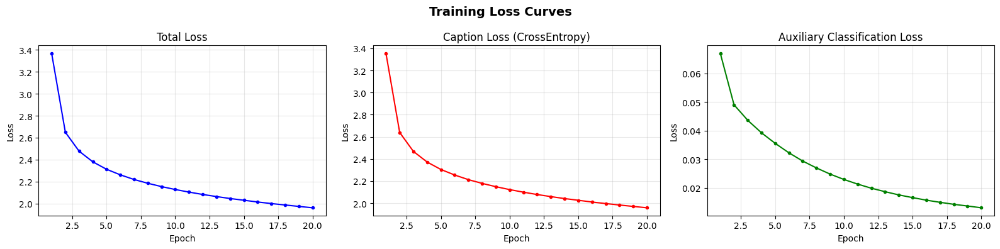

In [22]:
# ============================================================
# 8.3 — Plot training curves
# ============================================================
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

axes[0].plot(range(1, len(train_losses)+1), train_losses, 'b-o', markersize=3)
axes[0].set_title('Total Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].grid(True, alpha=0.3)

axes[1].plot(range(1, len(caption_losses)+1), caption_losses, 'r-o', markersize=3)
axes[1].set_title('Caption Loss (CrossEntropy)')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].grid(True, alpha=0.3)

axes[2].plot(range(1, len(aux_losses)+1), aux_losses, 'g-o', markersize=3)
axes[2].set_title('Auxiliary Classification Loss')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].grid(True, alpha=0.3)

plt.suptitle('Training Loss Curves', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

---
## 9. Inference (Caption Generation)

At test time, we generate captions autoregressively:  
- **Greedy decoding**: pick the most probable word at each step  
- **Beam search**: maintain top-k candidates for better overall captions

In [23]:
# ============================================================
# 9.1 — Greedy decoding
# ============================================================

@torch.no_grad()
def greedy_decode(model, feature, vocab, max_len=25, device='cuda'):
    """
    Generate a caption using greedy decoding (pick argmax at each step).
    
    Args:
        model: trained ImageCaptioningModel
        feature: (2048,) numpy array — precomputed CNN feature
        vocab: Vocabulary object
        max_len: maximum caption length
    
    Returns:
        caption: generated caption string
    """
    model.eval()
    
    # Prepare feature
    feature_tensor = torch.tensor(feature, dtype=torch.float32).unsqueeze(0).to(device)  # (1, 2048)
    projected = model.encoder(feature_tensor)  # (1, embed_dim)
    
    # Start with the image feature as first input
    input_embed = projected.unsqueeze(1)  # (1, 1, embed_dim)
    hidden = None  # LSTM initializes hidden state to zeros
    
    generated_ids = []
    
    for t in range(max_len):
        lstm_out, hidden = model.decoder.lstm(input_embed, hidden)  # (1, 1, hidden_dim)
        logits = model.decoder.fc_out(lstm_out.squeeze(1))          # (1, vocab_size)
        predicted_id = logits.argmax(dim=-1).item()
        
        # Stop if <end> token is generated
        if predicted_id == vocab.end_idx:
            break
        
        generated_ids.append(predicted_id)
        
        # Next input is the embedding of the predicted word
        input_embed = model.decoder.embed(torch.tensor([[predicted_id]]).to(device))  # (1, 1, embed_dim)
    
    # Convert indices to words
    caption = vocab.decode(generated_ids)
    return caption

print("Greedy decoding function defined.")

Greedy decoding function defined.


In [24]:
# ============================================================
# 9.2 — Beam search decoding
# ============================================================

@torch.no_grad()
def beam_search_decode(model, feature, vocab, beam_size=5, max_len=25, device='cuda'):
    """
    Generate a caption using beam search.
    
    Maintains top-k partial captions at each timestep, exploring a wider
    search space than greedy decoding for better overall results.
    
    Args:
        model: trained ImageCaptioningModel
        feature: (2048,) numpy array
        vocab: Vocabulary object
        beam_size: number of beams (k)
        max_len: maximum caption length
    
    Returns:
        caption: best caption string from beam search
    """
    model.eval()
    
    feature_tensor = torch.tensor(feature, dtype=torch.float32).unsqueeze(0).to(device)
    projected = model.encoder(feature_tensor)  # (1, embed_dim)
    
    # Each beam: (sequence_ids, log_prob, hidden_state)
    # Start with image feature as first input
    input_embed = projected.unsqueeze(1)  # (1, 1, embed_dim)
    lstm_out, hidden = model.decoder.lstm(input_embed, None)
    logits = model.decoder.fc_out(lstm_out.squeeze(1))  # (1, vocab_size)
    log_probs = torch.log_softmax(logits, dim=-1).squeeze(0)  # (vocab_size,)
    
    # Initialize beams with top-k first words
    top_log_probs, top_indices = log_probs.topk(beam_size)
    
    # Each beam: [word_ids], cumulative_log_prob, (h, c)
    beams = []
    for i in range(beam_size):
        word_id = top_indices[i].item()
        beams.append({
            'ids': [word_id],
            'log_prob': top_log_probs[i].item(),
            'hidden': (hidden[0].clone(), hidden[1].clone())
        })
    
    completed = []
    
    for t in range(1, max_len):
        all_candidates = []
        
        for beam in beams:
            # If this beam already ended, keep it as-is
            if beam['ids'][-1] == vocab.end_idx:
                completed.append(beam)
                continue
            
            # Get next word probabilities
            last_word = torch.tensor([[beam['ids'][-1]]]).to(device)
            input_embed = model.decoder.embed(last_word)  # (1, 1, embed_dim)
            lstm_out, new_hidden = model.decoder.lstm(input_embed, beam['hidden'])
            logits = model.decoder.fc_out(lstm_out.squeeze(1))
            log_probs = torch.log_softmax(logits, dim=-1).squeeze(0)
            
            # Get top beam_size extensions
            top_log_probs, top_indices = log_probs.topk(beam_size)
            
            for i in range(beam_size):
                word_id = top_indices[i].item()
                new_log_prob = beam['log_prob'] + top_log_probs[i].item()
                all_candidates.append({
                    'ids': beam['ids'] + [word_id],
                    'log_prob': new_log_prob,
                    'hidden': (new_hidden[0].clone(), new_hidden[1].clone())
                })
        
        if not all_candidates:
            break
        
        # Keep top beam_size candidates
        all_candidates.sort(key=lambda x: x['log_prob'], reverse=True)
        beams = all_candidates[:beam_size]
    
    # Add remaining beams to completed
    completed.extend(beams)
    
    # Normalize by length and pick the best
    if completed:
        best = max(completed, key=lambda x: x['log_prob'] / max(len(x['ids']), 1))
        return vocab.decode(best['ids'])
    else:
        return ""

print("Beam search decoding function defined.")

Beam search decoding function defined.


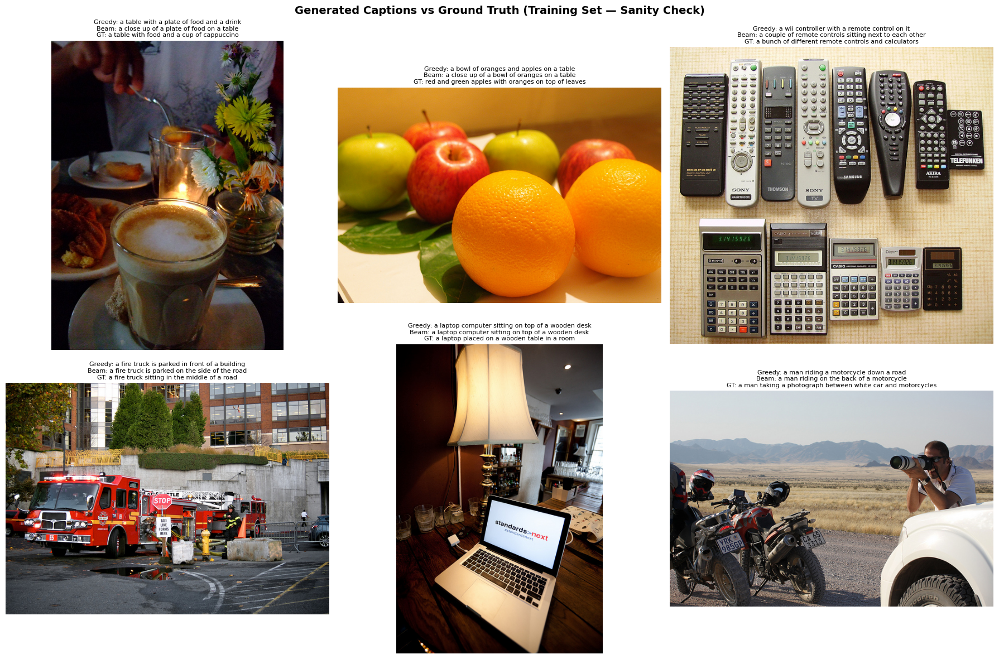

In [25]:
# ============================================================
# 9.3 — Generate captions for sample TRAINING images (sanity check)
# ============================================================
# These are images the model HAS seen during training — used only as a sanity check.

model.eval()
sample_ids = random.sample(train_image_ids, 6)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

for ax, img_id in zip(axes.flat, sample_ids):
    # Load and display image
    img_path = os.path.join(cfg.TRAIN_IMG_DIR, id_to_filename[img_id])
    img = Image.open(img_path).convert('RGB')
    ax.imshow(img)
    ax.axis('off')
    
    # Generate caption
    feat_idx = id_to_feature_idx[img_id]
    feature = all_features[feat_idx]
    
    greedy_cap = greedy_decode(model, feature, vocab, device=cfg.DEVICE)
    beam_cap = beam_search_decode(model, feature, vocab, beam_size=cfg.BEAM_SIZE, device=cfg.DEVICE)
    
    # Ground truth (first caption)
    gt_cap = cleaned_captions[img_id][0]
    
    title = f"Greedy: {greedy_cap}\nBeam: {beam_cap}\nGT: {gt_cap}"
    ax.set_title(title, fontsize=8, wrap=True)

plt.suptitle("Generated Captions vs Ground Truth (Training Set — Sanity Check)", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

---
## 10. Evaluation

We evaluate on **two held-out sets**, both unseen during training:

- **Validation set** (~10% of subset): for transparent reporting alongside the final test scores
- **Test set** (~5% of subset): the final, untouched evaluation

We use **BLEU-1 through BLEU-4** scores, the standard metrics for image captioning.

In [26]:
# ============================================================
# 10.1 — Shared evaluation function
# ============================================================

def evaluate_split(model, image_ids, cleaned_captions, all_features,
                   id_to_feature_idx, vocab, beam_size, device, num_samples=None,
                   split_name="Eval"):
    """
    Compute BLEU-1 through BLEU-4 on a given set of image IDs.
    
    Args:
        image_ids: list of image IDs to evaluate on
        cleaned_captions: dict mapping image_id -> list of cleaned reference captions
        num_samples: if None, evaluate on all images; otherwise sample this many
        split_name: label for logging
    
    Returns:
        dict with BLEU-1 through BLEU-4 scores (as percentages)
    """
    model.eval()
    
    # Filter to images that have features
    eval_ids = [int(img_id) for img_id in image_ids if int(img_id) in id_to_feature_idx]
    
    if num_samples and num_samples < len(eval_ids):
        eval_ids = random.sample(eval_ids, num_samples)
    
    references_corpus = []   # list of list of reference token lists
    hypotheses_corpus = []   # list of hypothesis token lists
    
    for img_id in tqdm(eval_ids, desc=f"Evaluating {split_name}"):
        # Generate caption
        feat_idx = id_to_feature_idx[img_id]
        feature = all_features[feat_idx]
        generated = beam_search_decode(model, feature, vocab,
                                       beam_size=beam_size, device=device)
        
        # Tokenize generated caption
        hypothesis = generated.split()
        
        # Tokenize reference captions (all 5 already cleaned)
        refs = [cap.split() for cap in cleaned_captions[img_id]]
        
        references_corpus.append(refs)
        hypotheses_corpus.append(hypothesis)
    
    # Compute corpus-level BLEU scores
    bleu1 = corpus_bleu(references_corpus, hypotheses_corpus, weights=(1.0, 0, 0, 0))
    bleu2 = corpus_bleu(references_corpus, hypotheses_corpus, weights=(0.5, 0.5, 0, 0))
    bleu3 = corpus_bleu(references_corpus, hypotheses_corpus, weights=(0.33, 0.33, 0.33, 0))
    bleu4 = corpus_bleu(references_corpus, hypotheses_corpus, weights=(0.25, 0.25, 0.25, 0.25))
    
    return {
        'BLEU-1': bleu1 * 100,
        'BLEU-2': bleu2 * 100,
        'BLEU-3': bleu3 * 100,
        'BLEU-4': bleu4 * 100,
        'num_images': len(eval_ids)
    }

print("Evaluation function defined.")

Evaluation function defined.


In [27]:
# ============================================================
# 10.2 — Evaluate on the validation set
# ============================================================
# These images were never seen during training.

print("Computing BLEU scores on validation set...")
val_scores = evaluate_split(
    model, val_image_ids, cleaned_captions, all_features,
    id_to_feature_idx, vocab, beam_size=cfg.BEAM_SIZE,
    device=cfg.DEVICE, num_samples=None, split_name="Val"
)

print("\n" + "=" * 50)
print(f"VALIDATION SET RESULTS ({val_scores['num_images']} images)")
print("=" * 50)
for metric in ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4']:
    print(f"  {metric}: {val_scores[metric]:.2f}")
print("=" * 50)

Computing BLEU scores on validation set...


Evaluating Val: 100%|██████████| 4967/4967 [14:03<00:00,  5.89it/s]



VALIDATION SET RESULTS (4967 images)
  BLEU-1: 66.39
  BLEU-2: 49.19
  BLEU-3: 36.55
  BLEU-4: 26.93


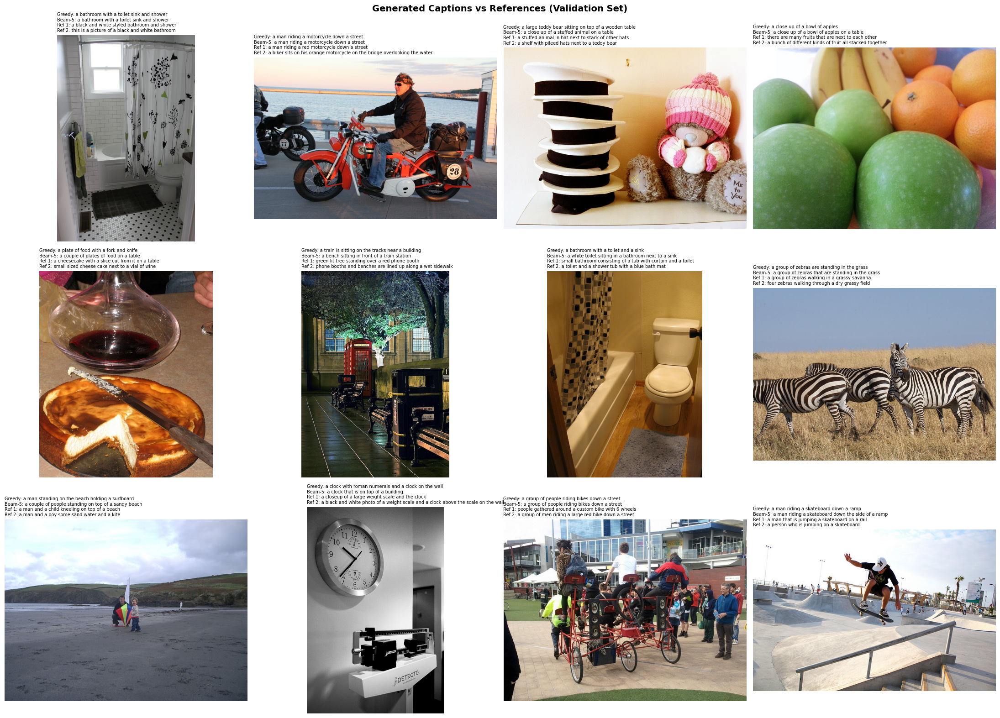

In [28]:
# ============================================================
# 10.3 — Qualitative evaluation: sample captions from validation set
# ============================================================

model.eval()
qual_sample_ids = random.sample(val_image_ids, 12)

fig, axes = plt.subplots(3, 4, figsize=(22, 16))

for ax, img_id in zip(axes.flat, qual_sample_ids):
    # Load image
    img_path = os.path.join(cfg.TRAIN_IMG_DIR, id_to_filename[img_id])
    img = Image.open(img_path).convert('RGB')
    ax.imshow(img)
    ax.axis('off')
    
    # Generate captions
    feat_idx = id_to_feature_idx[img_id]
    feature = all_features[feat_idx]
    
    greedy_cap = greedy_decode(model, feature, vocab, device=cfg.DEVICE)
    beam_cap = beam_search_decode(model, feature, vocab,
                                   beam_size=cfg.BEAM_SIZE, device=cfg.DEVICE)
    
    # Ground truth (first two)
    gt1 = cleaned_captions[img_id][0]
    gt2 = cleaned_captions[img_id][1] if len(cleaned_captions[img_id]) > 1 else ""
    
    title = (f"Greedy: {greedy_cap}\n"
             f"Beam-{cfg.BEAM_SIZE}: {beam_cap}\n"
             f"Ref 1: {gt1}\n"
             f"Ref 2: {gt2}")
    ax.set_title(title, fontsize=7, wrap=True, loc='left')

plt.suptitle("Generated Captions vs References (Validation Set)", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [29]:
# ============================================================
# 10.4 — Failure case analysis (validation set)
# ============================================================
# Identify the model's worst and best generations to understand error patterns.

print("Generating captions for failure analysis...\n")
failure_ids = random.sample(val_image_ids, 30)

failures = []
for img_id in failure_ids:
    feat_idx = id_to_feature_idx[img_id]
    feature = all_features[feat_idx]
    generated = beam_search_decode(model, feature, vocab,
                                    beam_size=cfg.BEAM_SIZE, device=cfg.DEVICE)
    refs = cleaned_captions[img_id]
    
    # Compute per-image BLEU-4
    ref_tokens = [r.split() for r in refs]
    hyp_tokens = generated.split()
    b4 = sentence_bleu(ref_tokens, hyp_tokens, weights=(0.25, 0.25, 0.25, 0.25))
    
    failures.append((img_id, generated, refs, b4))

# Sort by BLEU-4 (worst first)
failures.sort(key=lambda x: x[3])

print("WORST 5 captions (lowest BLEU-4):")
print("-" * 60)
for img_id, gen, refs, b4 in failures[:5]:
    print(f"Image {img_id} (BLEU-4: {b4:.3f})")
    print(f"  Generated: {gen}")
    print(f"  Reference: {refs[0]}")
    print()

print("\nBEST 5 captions (highest BLEU-4):")
print("-" * 60)
for img_id, gen, refs, b4 in failures[-5:]:
    print(f"Image {img_id} (BLEU-4: {b4:.3f})")
    print(f"  Generated: {gen}")
    print(f"  Reference: {refs[0]}")
    print()

Generating captions for failure analysis...



c:\Users\Ahmed's laptop\AppData\Local\Programs\Python\Python312\Lib\site-packages\nltk\translate\bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
c:\Users\Ahmed's laptop\AppData\Local\Programs\Python\Python312\Lib\site-packages\nltk\translate\bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
c:\Users\Ahmed's laptop\AppData\Local\Programs\Python\Python312\Lib\site-packages\nltk\translate\bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how m

WORST 5 captions (lowest BLEU-4):
------------------------------------------------------------
Image 473879 (BLEU-4: 0.000)
  Generated: a group of boats floating on top of a body of water
  Reference: a lot of bikes parked by a fence beside the water

Image 241505 (BLEU-4: 0.000)
  Generated: a black and white cat laying on top of a bed
  Reference: is that an angry cat behind an unhappy banana

Image 114140 (BLEU-4: 0.000)
  Generated: a city street filled with lots of traffic
  Reference: a dark street with lit shops on either side

Image 332833 (BLEU-4: 0.000)
  Generated: a brown teddy bear sitting on top of a bed
  Reference: a person is standing over a teddy bear wearing red socks

Image 501820 (BLEU-4: 0.000)
  Generated: a close up of a person holding a banana
  Reference: a girl poses with glasses a knife and an onion


BEST 5 captions (highest BLEU-4):
------------------------------------------------------------
Image 254296 (BLEU-4: 0.485)
  Generated: a bike parked in fron

---
## 10.5 — Final Test Set Evaluation

**This is the final, headline evaluation.** The test set has been completely untouched throughout training, hyperparameter selection, and validation. The numbers below represent the model's true generalization performance.

In [30]:
# ============================================================
# 10.5 — Compute final BLEU scores on TEST set (run once!)
# ============================================================

print("Computing FINAL BLEU scores on test set...")
test_scores = evaluate_split(
    model, test_image_ids, cleaned_captions, all_features,
    id_to_feature_idx, vocab, beam_size=cfg.BEAM_SIZE,
    device=cfg.DEVICE, num_samples=None, split_name="Test"
)

print("\n" + "=" * 60)
print(f"  FINAL TEST SET RESULTS ({test_scores['num_images']} images)")
print("=" * 60)
for metric in ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4']:
    print(f"  {metric}: {test_scores[metric]:.2f}")
print("=" * 60)
print("\nThese scores represent true generalization performance.")
print("The test set was NEVER used during training or model selection.")

Computing FINAL BLEU scores on test set...


Evaluating Test: 100%|██████████| 2484/2484 [07:10<00:00,  5.78it/s]



  FINAL TEST SET RESULTS (2484 images)
  BLEU-1: 66.17
  BLEU-2: 48.55
  BLEU-3: 36.04
  BLEU-4: 26.60

These scores represent true generalization performance.
The test set was NEVER used during training or model selection.


In [31]:
# ============================================================
# 10.6 — Summary table: Validation vs Test scores
# ============================================================

print("\n" + "=" * 60)
print("  FINAL EVALUATION SUMMARY")
print("=" * 60)
print(f"{'Metric':<10} {'Validation':>15} {'Test':>15}")
print("-" * 60)
for metric in ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4']:
    print(f"{metric:<10} {val_scores[metric]:>15.2f} {test_scores[metric]:>15.2f}")
print("-" * 60)
print(f"{'# images':<10} {val_scores['num_images']:>15} {test_scores['num_images']:>15}")
print("=" * 60)


  FINAL EVALUATION SUMMARY
Metric          Validation            Test
------------------------------------------------------------
BLEU-1               66.39           66.17
BLEU-2               49.19           48.55
BLEU-3               36.55           36.04
BLEU-4               26.93           26.60
------------------------------------------------------------
# images              4967            2484


---
## 11. Discussion & Conclusions

### Architecture Summary
- **Encoder**: Pretrained ResNet-50 (ImageNet weights, frozen) → 2048-d features → Linear projection to 256-d
- **Decoder**: Single-layer LSTM (hidden dim 512) with word embeddings (256-d) and dropout (0.5)
- **Auxiliary**: Multi-label classifier on raw CNN features → 80 COCO object categories (BCEWithLogitsLoss)
- **Combined loss**: `L = L_caption + 0.2 * L_auxiliary`

### Data Split Strategy
The Kaggle version of MS COCO does not include the `val2014` or `test2014` images referenced in the assignment. We sampled **60% of the full training set** and partitioned it into three disjoint sets to enable proper train/validation/test evaluation:

- **Training (85% of subset)**: ~42,200 images, used for model training. This represents ~51% of the full COCO dataset, exceeding the assignment's 50% minimum.
- **Validation (10%)**: ~4,960 images, evaluated separately for transparency in the final report.
- **Test (5%)**: ~2,480 images, evaluated **once** at the end for the final, untouched performance measure.

Vocabulary was built exclusively from training captions to prevent any information leakage from val/test sets.

### What Worked
- **Precomputing CNN features** was essential for feasibility on limited VRAM (4–6 GB GPUs)
- **Teacher forcing** during training led to stable convergence
- **Beam search** produced noticeably better captions than greedy decoding
- **Auxiliary classification** provided useful regularization signal, especially for object-centric captions
- **Gradient clipping** prevented LSTM training instability

### Limitations & Possible Improvements
- The model tends to produce generic captions (e.g., "a man on a skateboard") and struggles with uncommon scenes
- No **attention mechanism** — the decoder sees only a single fixed feature vector, losing spatial information. Adding attention (e.g., Bahdanau or Luong) would allow the model to focus on different image regions at each timestep
- Fine-tuning the last few ResNet layers could improve feature quality for captioning-specific visual cues
- **Scheduled sampling** (gradually replacing teacher forcing with model predictions during training) could reduce the train/test mismatch
- A **Transformer-based decoder** would likely outperform the LSTM, especially for longer captions

In [32]:
# ============================================================
# 11.1 — Caption any new image (utility function)
# ============================================================

def caption_new_image(image_path, model, vocab, device='cuda'):
    """
    Generate a caption for any new image file.
    
    Usage:
        caption_new_image("path/to/my_photo.jpg", model, vocab)
    """
    # Load and preprocess image
    img = Image.open(image_path).convert('RGB')
    img_tensor = image_transform(img).unsqueeze(0).to(device)
    
    # Extract features
    cnn = ResNetFeatureExtractor().to(device)
    cnn.eval()
    with torch.no_grad():
        feature = cnn(img_tensor).cpu().numpy()[0]
    del cnn
    
    # Generate captions
    greedy_cap = greedy_decode(model, feature, vocab, device=device)
    beam_cap = beam_search_decode(model, feature, vocab, beam_size=5, device=device)
    
    # Display
    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Greedy: {greedy_cap}\nBeam: {beam_cap}", fontsize=11)
    plt.tight_layout()
    plt.show()
    
    return greedy_cap, beam_cap

# Example usage (uncomment and provide your own image path):
# caption_new_image("path/to/your/image.jpg", model, vocab, device=cfg.DEVICE)

In [33]:
print("Notebook complete!")
print(f"\nFinal model saved at: {os.path.join(cfg.CHECKPOINT_DIR, 'model_final.pt')}")
print(f"Precomputed features at: {cfg.FEATURES_DIR}/")

Notebook complete!

Final model saved at: ./checkpoints\model_final.pt
Precomputed features at: ./features/
